In [5]:
import os
from dotenv import load_dotenv
import torch
import torchvision.models as models
from torchvision import transforms
import fal_client
import requests
import json
import google.generativeai as genai
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import PIL.Image
import base64
import shutil
import os
from gradio_client import Client
import openai
from io import BytesIO



In [6]:
load_dotenv()

gemini_api_key = os.getenv("GEMINI_API_KEY")
deepseek_api_key = os.getenv("DEEPSEEK_API_KEY")
os.environ["FAL_KEY"] = os.getenv("FAL_KEY")

In [7]:
story = """The Clockmaker’s Secret

In the quiet town of Ravenshire, nestled between misty hills, lived an old clockmaker named Elias Thornton. His workshop, a small wooden cottage on the edge of the town square, was filled with intricate gears, ticking clocks, and the scent of polished oak. The people of Ravenshire revered Elias not just for his craftsmanship but for his ability to mend even the most broken timepieces—some believed he could even fix time itself.

One evening, as Elias was closing his shop, a hooded stranger entered. His eyes, piercing and restless, studied the clocks lining the walls. “I need a special timepiece,” the man murmured, placing a bundle of old, yellowed papers on the counter.

Elias unrolled them carefully. They contained blueprints—designs for a clock unlike any he had ever seen. The mechanisms were impossibly intricate, the gears arranged in a pattern that defied logic. “Who gave you these?” Elias asked, his voice steady.

The stranger hesitated before answering, “It was found in an abandoned house. People say it belonged to your great-grandfather.”

Elias stiffened. His great-grandfather, Victor Thornton, had been a renowned inventor, but he vanished mysteriously decades ago, leaving behind only rumors. Elias had always believed that his disappearance had something to do with time itself.

Intrigued and unsettled, Elias took on the challenge. Days turned into weeks as he meticulously constructed the clock, following the precise instructions in the blueprints. Every night, he felt as if unseen eyes were watching him. As the final gear clicked into place, the clock began to tick—but not in an ordinary way. The hands moved forward, then backward, then paused unnaturally. A strange hum filled the workshop, and suddenly, the world around him blurred.

When the dizziness passed, Elias found himself standing in his workshop—but it was no longer his. The walls were newer, the tools untouched by time. A younger man stood across the room, working on an identical clock. Elias gasped. It was Victor Thornton—his great-grandfather.

Victor turned, eyes widening. “You activated it,” he whispered. “I never thought anyone would.”

Elias struggled for words. “Where… when am I?”

Victor sighed. “The clock is more than a machine—it’s a gateway. I built it to travel through time, but I made a mistake. It trapped me here, in the past.”

Elias realized what he had to do. With shaking hands, he examined the clock. A single misaligned gear had caused the malfunction. Carefully, he adjusted it. The hum grew louder, and the world blurred again.

When Elias opened his eyes, he was back in his workshop, alone. The strange clock was gone, but on his workbench lay a note, written in old ink.

“Time is a gift, not a tool to be controlled. Live well, my grandson.”

Elias smiled, knowing that Victor had finally found his way home."""

print(story)

The Clockmaker’s Secret

In the quiet town of Ravenshire, nestled between misty hills, lived an old clockmaker named Elias Thornton. His workshop, a small wooden cottage on the edge of the town square, was filled with intricate gears, ticking clocks, and the scent of polished oak. The people of Ravenshire revered Elias not just for his craftsmanship but for his ability to mend even the most broken timepieces—some believed he could even fix time itself.

One evening, as Elias was closing his shop, a hooded stranger entered. His eyes, piercing and restless, studied the clocks lining the walls. “I need a special timepiece,” the man murmured, placing a bundle of old, yellowed papers on the counter.

Elias unrolled them carefully. They contained blueprints—designs for a clock unlike any he had ever seen. The mechanisms were impossibly intricate, the gears arranged in a pattern that defied logic. “Who gave you these?” Elias asked, his voice steady.

The stranger hesitated before answering, “

In [13]:
genai.configure(api_key=gemini_api_key)
model = genai.GenerativeModel("models/gemini-1.5-flash")

#settings of the story
#length
n = input("Enter the number of images you want to generate the story for: ")
num = int(n)

# Generate text
prompt = (f"Write this story:'{story}' in {n}-parts. "
          "important: story_parts = result.split('\n\n\n') we will use this to split the story into parts. "
          "Start your response from the beginning of first part and conclude it at the last part.")

result = model.generate_content(prompt)

result = result.candidates[0].content.parts[0].text
story_parts = result.split("\n\n\n")

# print(story_parts[0])
print(result)

**Part 1:**

In the quiet town of Ravenshire, nestled between misty hills, lived an old clockmaker named Elias Thornton. His workshop, a small wooden cottage on the edge of the town square, was filled with intricate gears, ticking clocks, and the scent of polished oak. The people of Ravenshire revered Elias not just for his craftsmanship but for his ability to mend even the most broken timepieces—some believed he could even fix time itself.  One evening, as Elias was closing his shop, a hooded stranger entered. His eyes, piercing and restless, studied the clocks lining the walls. “I need a special timepiece,” the man murmured, placing a bundle of old, yellowed papers on the counter.


**Part 2:**

Elias unrolled the papers carefully. They contained blueprints—designs for a clock unlike any he had ever seen. The mechanisms were impossibly intricate, the gears arranged in a pattern that defied logic. “Who gave you these?” Elias asked, his voice steady. The stranger hesitated before answe

In [16]:
print(story_parts[5])

**Part 6:**

When Elias opened his eyes, he was back in his workshop, alone. The strange clock was gone, but on his workbench lay a note, written in old ink. “Time is a gift, not a tool to be controlled. Live well, my grandson.” Elias smiled, knowing that Victor had finally found his way home.



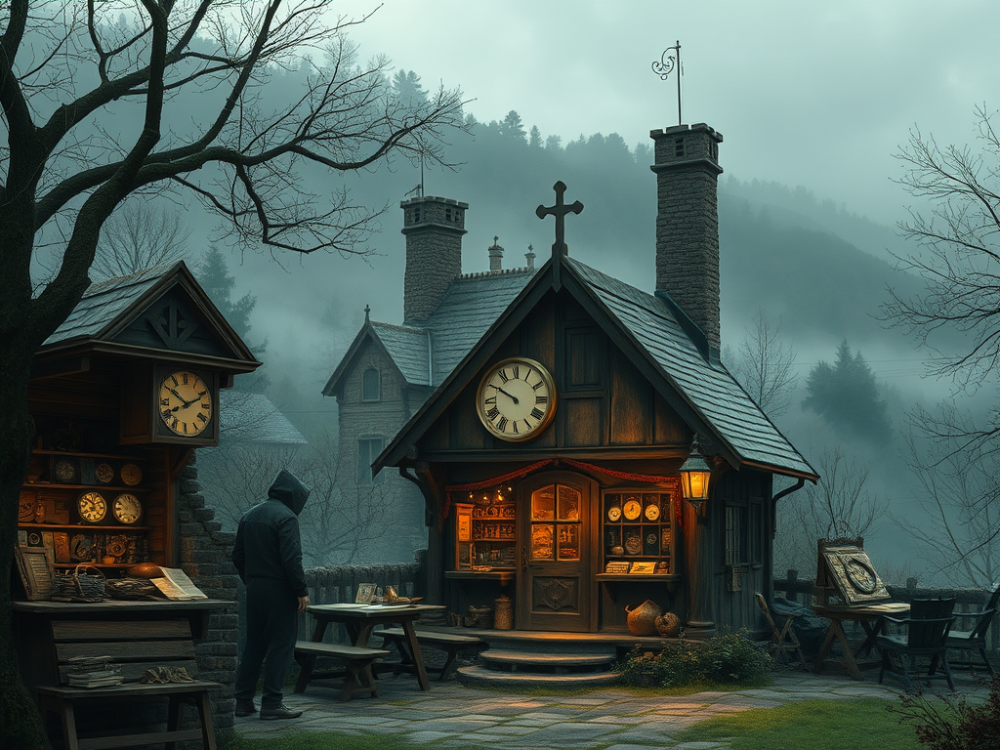

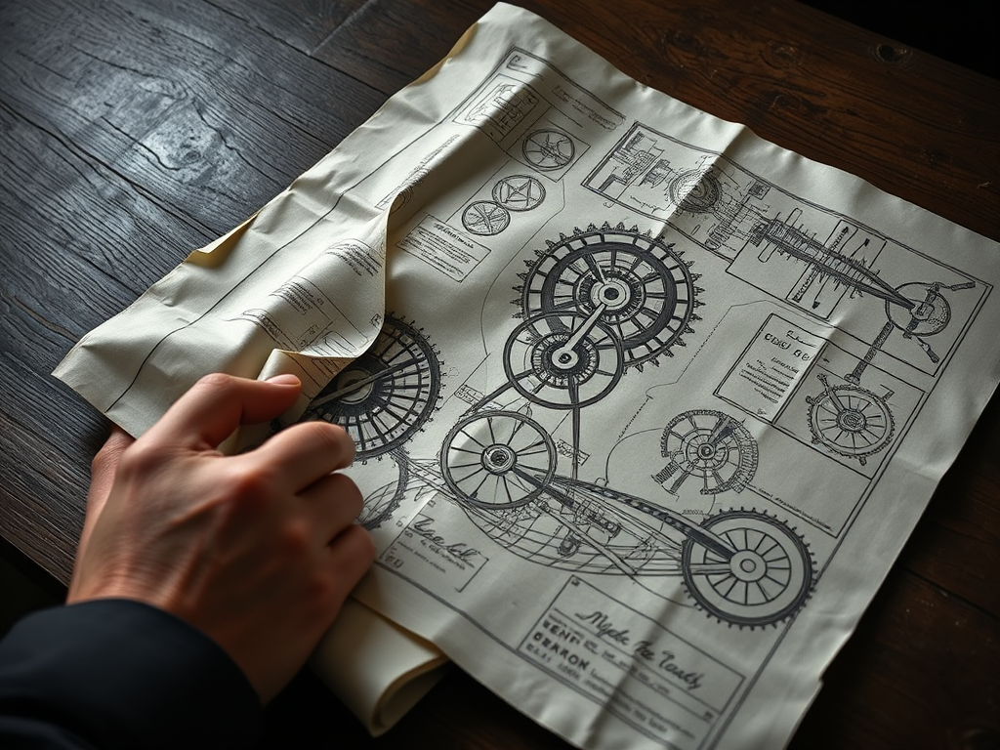

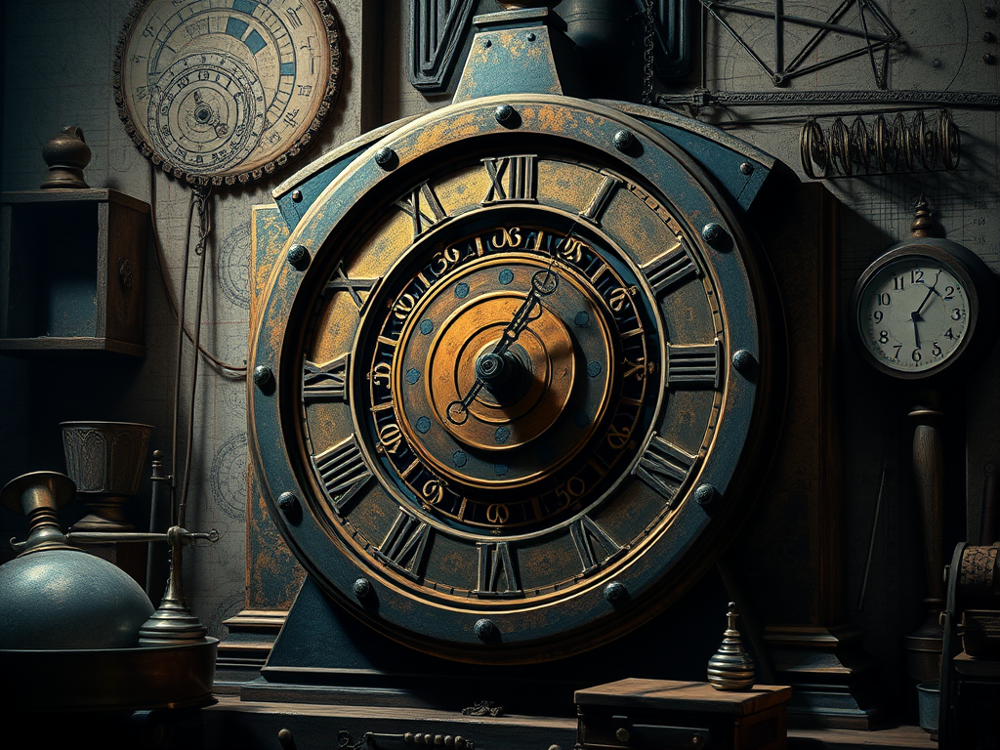

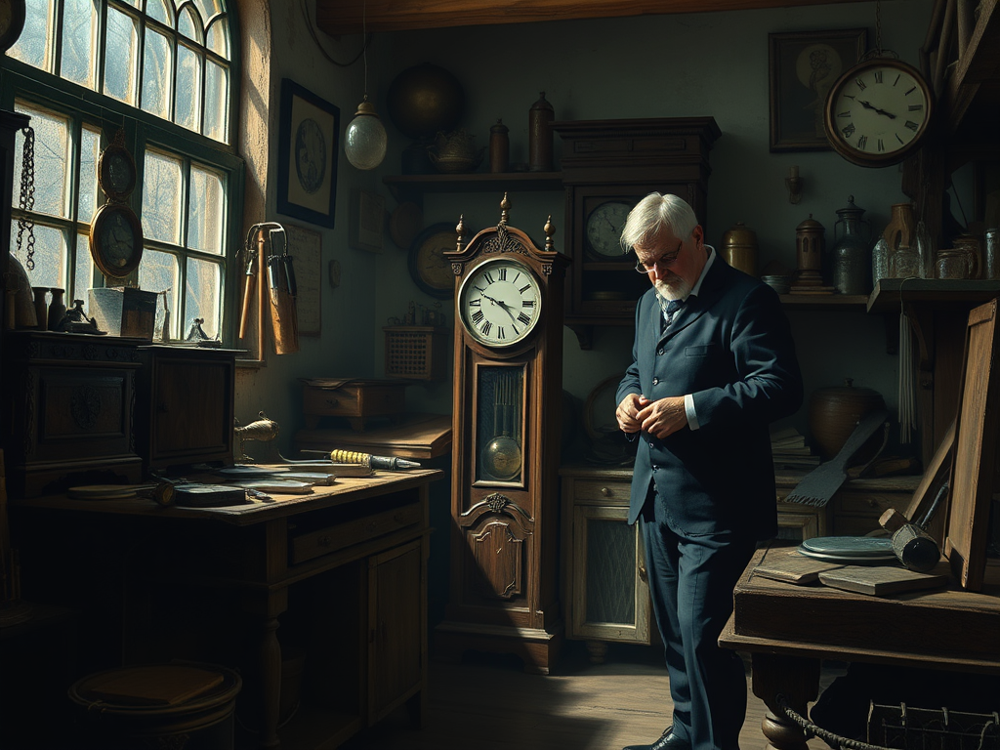

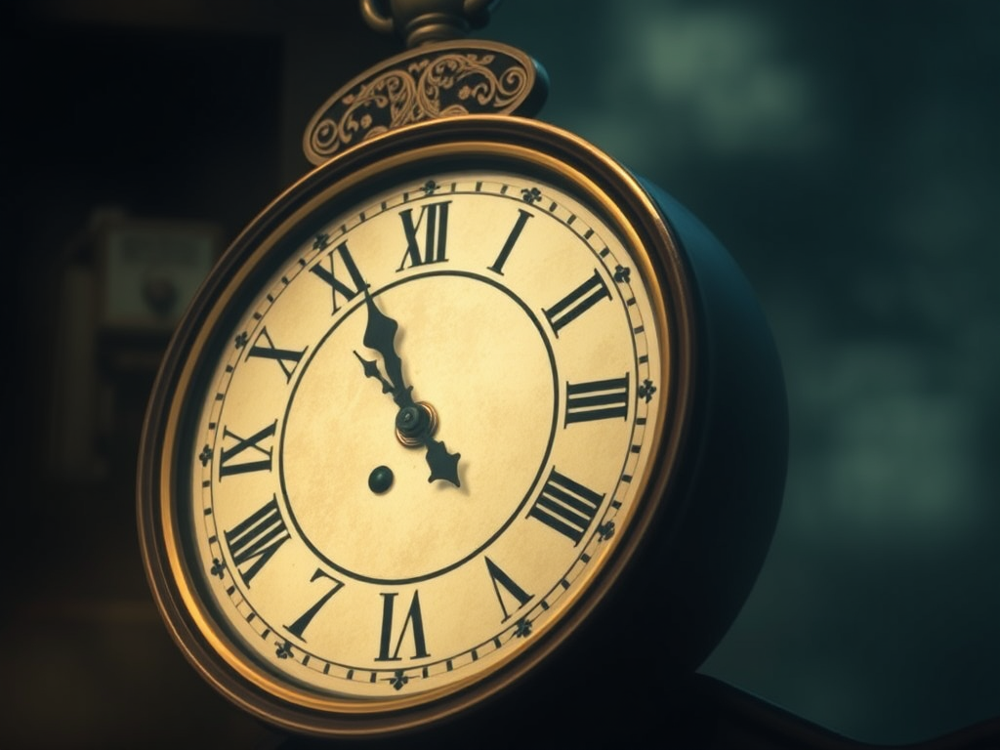

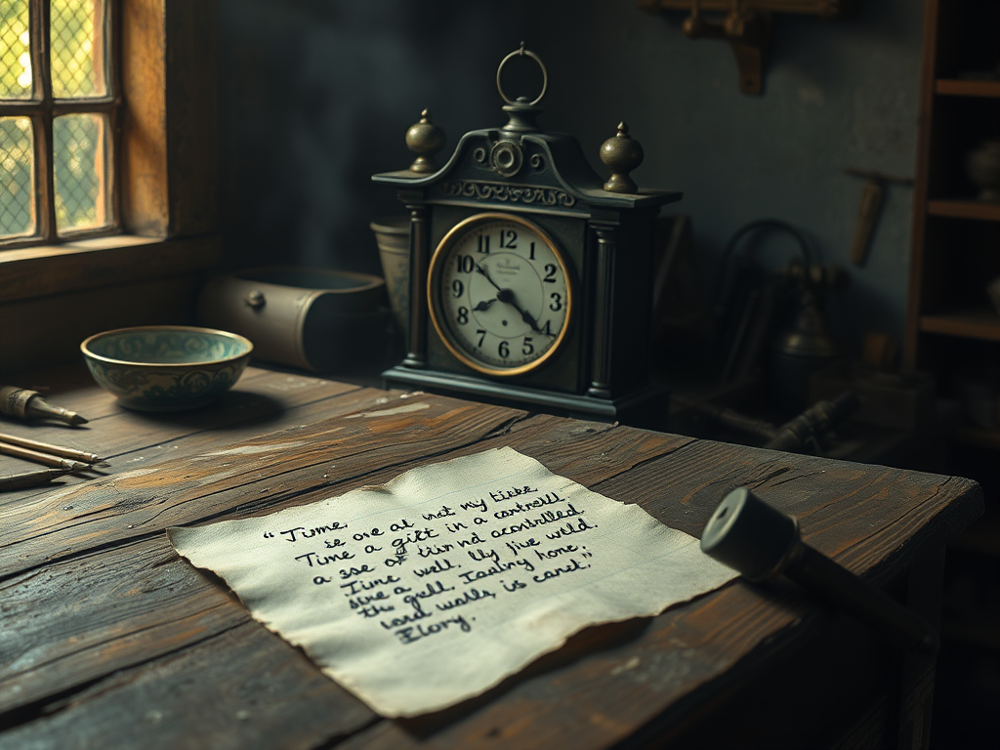

In [20]:
# Generate images using flux schnell

# Function to handle queue updates
def on_queue_update(update):
    if isinstance(update, fal_client.InProgress):
        for log in update.logs:
            print(log["message"])

# Get user input for art style
art_style = input("Enter the art style you want to generate the images in: ")

images = []
for i in range(min(num, len(story_parts))):
    image_prompt = f"Generate an image for this part of the story: '{story_parts[i]} with a touch of {art_style}-theme'"

    result = fal_client.subscribe(
        "fal-ai/flux/schnell",
        arguments={"prompt": image_prompt},
        with_logs=True,
        on_queue_update=on_queue_update,
    )

    # Ensure the response contains images
    if "images" in result and result["images"]:
        image_url = result["images"][0]["url"]

        # Download the image
        response = requests.get(image_url)
        image = Image.open(BytesIO(response.content))

        # Display the image
        display(image)  # For Jupyter Notebook

        # Store image for later use
        images.append(image)
    else:
        print(f"Failed to generate image for: {story_parts[i]}")

    